In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import os
import Tools

# prepare data and model

In [2]:
reg = joblib.load('saved_model/reg_ridge.pkl')
rfr = joblib.load('saved_model/rfr.pkl')
ml = joblib.load('saved_model/ml.pkl')

In [3]:
path = r'PTA_data_day'
dataList = []
tradeList = []
for filename in os.listdir (path):
    if filename < "ta1_day_20220905.csv":
        continue
    head = r"PTA_data_day/"
    data = pd.read_csv(head + filename)
    groupby = Tools.changeFreq(data, "1min")
    returnData = Tools.extractReturn(groupby.apply(Tools.lastPrice))
    dOpenInterest = Tools.extractDeltaOpenInterest(groupby.apply(Tools.openInterest))
    volume = Tools.extractVolume(groupby.apply(Tools.volume))
    turnover = Tools.extractTurnover(groupby.apply(Tools.turnover))
    high = groupby.apply(Tools.highPrice)
    low = groupby.apply(Tools.lowPrice)
    lastVolume = volume.shift(1)
    lastTurnover = turnover.shift(1)
    lastVwap = lastTurnover/lastVolume
    lastHigh = high.shift(1)
    lastLow = low.shift(1)
    lastPrice = groupby.apply(Tools.lastPrice).shift(1)
    alpha1 = -returnData.shift(1)
    alpha2 = dOpenInterest.shift(1)
    alpha3 = lastVwap/lastPrice
    alpha4 = (lastHigh - lastPrice)/(lastPrice - lastLow)
    alpha5 = groupby.apply(Tools.maxBidAskRate)
    alpha6 = alpha2**2
    alpha7 = alpha2*alpha1*np.abs(alpha4)
    frame = pd.concat([alpha1, alpha2, alpha3, alpha4, alpha5, alpha6, alpha7], axis = 1)
    tradeList.append(data)
    dataList.append(frame)

In [4]:
alpha = pd.concat(dataList, axis = 0)

In [5]:
alpha.replace([np.inf, -np.inf], np.nan, inplace = True)

In [6]:
alpha.dropna(inplace=True)

In [7]:
alpha

,0,1,2,3,4,5,6
Time,,,,,,,
2022-09-05 09:02:00,-0.000356,0.001288,5.004411,3.000000,306.108858,1.657917e-06,-1.375642e-06
2022-09-05 09:04:00,-0.002138,0.000918,4.993655,0.166667,40.442943,8.432138e-07,-3.271346e-07
2022-09-05 09:05:00,0.001422,0.000894,5.005516,8.000000,237.084372,7.994773e-07,1.017146e-05
2022-09-05 09:06:00,0.001068,0.002153,5.003944,5.000000,314.112063,4.636553e-06,1.149839e-05
2022-09-05 09:08:00,0.000714,0.002035,5.001153,1.500000,198.070815,4.139209e-06,2.179048e-06
...,...,...,...,...,...,...,...
2022-09-09 14:56:00,-0.000706,-0.003111,4.997760,0.000000,1121.395136,9.676470e-06,0.000000e+00
2022-09-09 14:57:00,-0.001411,-0.002410,4.997300,0.200000,240.834771,5.807060e-06,6.800096e-07
2022-09-09 14:58:00,-0.000000,0.000317,5.001014,2.000000,482.669954,1.006000e-07,-0.000000e+00


In [8]:
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm

In [9]:
# read the X and y for training data to get the criterias to transform data.
X_before = pd.read_csv("X.csv", index_col=0)
y_before = pd.read_csv("y.csv", index_col=0)

# backtest for ridge regression

In [10]:
ss_X = StandardScaler()
ss_X.fit(X_before)
X_ss = ss_X.transform(alpha)
ss_y = StandardScaler()
ss_y.fit(y_before)
X_ss = sm.add_constant(X_ss)
y_reg_pre = ss_y.inverse_transform(reg.predict(X_ss[:, [0, 1, 2, 5, 6, 7]]))

D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but Ridge was fitted with feature names
  warnings.warn(


In [11]:
y_reg_pre = pd.DataFrame(y_reg_pre, index = alpha.index)

In [12]:
y_reg_pre

,0
Time,
2022-09-05 09:02:00,0.000071
2022-09-05 09:04:00,-0.000381
2022-09-05 09:05:00,0.000999
2022-09-05 09:06:00,0.001385
2022-09-05 09:08:00,0.000732
...,...
2022-09-09 14:56:00,0.000166
2022-09-09 14:57:00,-0.000205
2022-09-09 14:58:00,0.000037


In [13]:
X_before_ss = ss_X.transform(X_before)

In [14]:
X_before_ss = sm.add_constant(X_before_ss)

In [15]:
y_reg_before = ss_y.inverse_transform(reg.predict(X_before_ss[:, [0, 1, 2, 5, 6, 7]]))

D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but Ridge was fitted with feature names
  warnings.warn(


C:\Users\11920\AppData\Local\Temp\ipykernel_1768\1657839803.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_reg_before)


<AxesSubplot: ylabel='Density'>

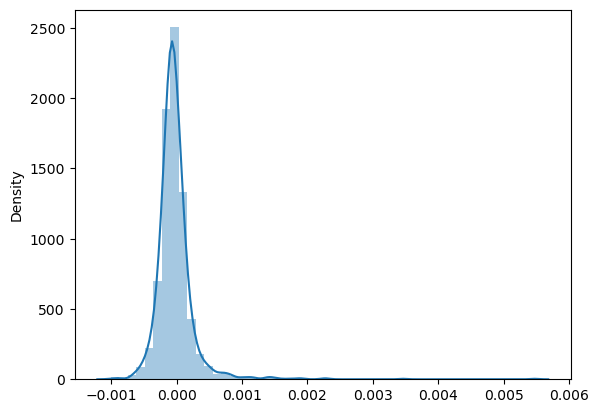

In [16]:
sns.distplot(y_reg_before)

In [17]:
import backtest

In [18]:
trade_data = pd.concat(tradeList, axis=0)

In [19]:
reg_test = backtest.Backtest(trade_data, y_reg_pre, y_reg_before.mean(), y_reg_before.std())

In [20]:
reg_test.run()

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
get pre_return:  -0.00012836257213094294
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  5.9392417972390026e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -2.1665687418153762e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.000118558016604153
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_ret

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00025241441640210904
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00025547434258997847
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00015823234913621388
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -3.0315290738276384e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00017084234125574986
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001107642760970749
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -9.73160660467284e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -3.446120805351779e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00015802650435311124
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0002679695981535403
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
get pre_return:  2.9882168375435708e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00013406011654989615
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001002101174191651
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0003047314485181254
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00014048616425053548
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002897634303689212
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -8.072691171580481e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0003167413845813103
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0003903995293036503
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -9.56627576340178

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  1.9143933847191968e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00032175673703750164
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -6.424117938699751e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00015358567463579352
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00013001149757233338
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0003125879663912263
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  3.6474427566920024e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pr

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00012382661940215522
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00010597792703748968
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -4.1347208054636727e-05
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0003223499195700527
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00036095075502827576
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
get pre_return:  4.991214768522138e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00031095945907213407
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00016004480245417933
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0003576479391288062
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00014122431108968886
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00014636766832999706
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -5.05657645941807e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -7.797474823344503e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00012501083821750877
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
get pre_return:  6.188518172570819e-06
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002825906580819532
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -1.0806250609533378e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00011933519240986428
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -3.270570020124085e-06
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00017216949434143293
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -4.1178841999153375e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  6.010030818498241e-06
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0004929650516550491
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00039909294821693686
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  7.789983892461829e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00015183722265882268
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001634640349636597
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -4.6078141861073925e-06
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -9.21264835455095e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  7.042459965272862e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -8.779559102634841e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -6.746697456464634e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

In [21]:
cumulation1 = reg_test.cal_cumulative_return()

Text(0, 0.5, 'profit')

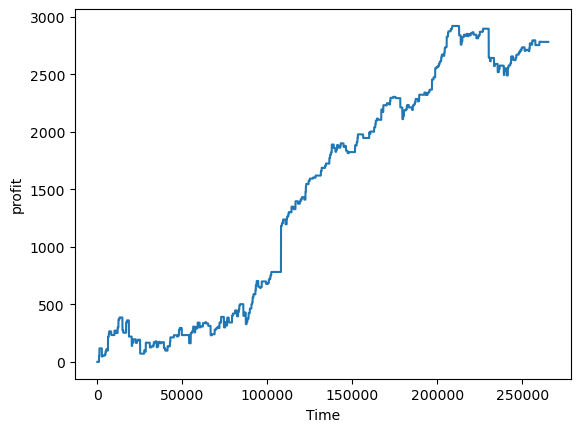

In [60]:
plt.plot(range(len(cumulation1)), cumulation1)
plt.xlabel("Time")
plt.ylabel("profit")

In [23]:
reg_test.cal_return_annually()

942.0033696344553

In [24]:
reg_test.cal_sharp_ratio()

0.013273154234706963

In [25]:
reg_test.cal_win_rate()

0.7285714285714285

In [26]:
reg_test.cal_profit_withdraw_ratio()

0.6673832839315533

# backtest for random forest

In [27]:
X_ss = ss_X.transform(alpha)
y_rfr_pre = ss_y.inverse_transform((rfr.predict(X_ss)).reshape(-1, 1))

D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [28]:
y_rfr_pre

array([[-1.68946467e-04],
       [-2.87373703e-04],
       [ 6.03465488e-04],
       [ 5.55311238e-04],
       [ 1.88820198e-04],
       [-9.87627574e-05],
       [-1.01745872e-04],
       [ 3.74989782e-05],
       [-1.31377238e-04],
       [-4.75952574e-05],
       [ 8.07031095e-05],
       [-2.63495911e-04],
       [-1.48661820e-04],
       [ 3.71710489e-04],
       [-7.79424929e-05],
       [ 5.21736635e-04],
       [ 7.12139302e-05],
       [ 2.04565084e-04],
       [-1.57325084e-04],
       [ 8.85969844e-05],
       [-1.31070472e-04],
       [-2.97875385e-04],
       [ 2.51860860e-04],
       [ 2.21366703e-04],
       [ 1.89874369e-04],
       [ 4.83887111e-05],
       [-4.76340546e-05],
       [-3.61547879e-04],
       [-1.56327946e-04],
       [ 2.71030541e-04],
       [-1.07945799e-04],
       [ 2.16002127e-04],
       [-7.32797935e-05],
       [-7.07867496e-05],
       [ 3.40938701e-04],
       [-1.59247860e-04],
       [-1.59856173e-04],
       [-1.29207891e-04],
       [-1.2

In [29]:
X_before_ss = ss_X.transform(X_before)

In [30]:
y_rfr_before = ss_y.inverse_transform((rfr.predict(X_before_ss)).reshape(-1, 1))

D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


C:\Users\11920\AppData\Local\Temp\ipykernel_1768\2950822052.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_rfr_before)


<AxesSubplot: ylabel='Density'>

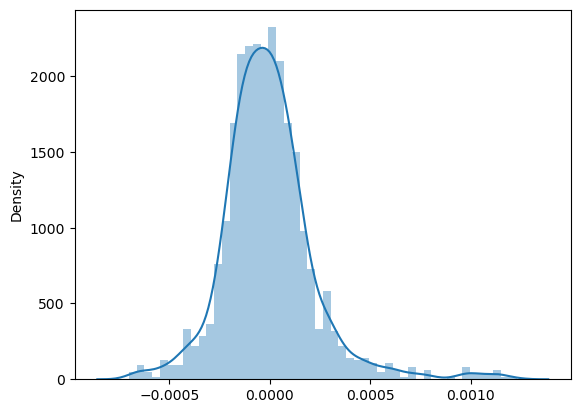

In [31]:
sns.distplot(y_rfr_before)

In [32]:
y_rfr_pre = pd.DataFrame(y_rfr_pre, index=alpha.index)

In [33]:
rfr_test = backtest.Backtest(trade_data, y_rfr_pre, y_rfr_before.mean(), y_rfr_before.std())

In [34]:
rfr_test.run()

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00013137723846242213
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00022136670261918332
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00010794579942322732
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -7.078674960050009e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -9.777546361956982e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  7.65573541935652e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_ret

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -5.073067358144548e-06
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00010552280555173947
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  6.760808649181011e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

get pre_return:  0.00014974994319412344
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0005935219882412464
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  9.987027544193549e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  7.458134969396028e-05
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  5.9169795251921724e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00012403804856133842
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00018260704762538388
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0005043467768077396
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00041578008178522435
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00012526736828845258
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -3.893880002523288e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  1.204731779045202e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  9.193436772368636e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001971110804449345
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -3.1589925503125145e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -3.574743425137818e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00027341127163782507
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -9.472876683177248e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  7.97605957125154e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_ret

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00018778491171450102
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00013310969472416244
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  1.7711637367078536e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001887922087631669
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002612372031580397
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
get pre_return:  -0.00018182521498111447
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00010293593948288864
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  3.8798977103214525e-05
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
get pre_return:  -0.00022215459448412337
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001904613027726552
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00021632300511289831
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00012999701116284652
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00015666109284304935
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -3.0600925689216874e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00021924487575188773
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -5.9342885969618845e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  7.025269149963937e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -5.428602706247109e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  2.609059473753649e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -2.0786345623636597e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00015919698932428066
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -8.375205089755232e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
get pre_return:  -8.252496906487489e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001844736133090922
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
get pre_return:  -0.0001528663873925861
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00042989700757169766
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -9.747096200620289e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0002892174002351943
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00014885011429268826
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002676542491016523
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00013957402651554264
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00041907893404661097
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pr

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  3.6835216762030284e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00020897312076040056
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -1.2845490907833623e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0001558654699013156
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  5.344397183112786e-06
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00013115583332524013
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00011951574727953754
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00011744458280165337
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00019454948294376446
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -4.8038066953956905e-06
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.000261054149729899
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00023541948229484667
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00015109727701834803
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  4.2173271662453164e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00013777724835602995
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00032393800954961784
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00011738857186514089
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  3.5819932100775365e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -8.025974899944575e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -6.60221690952299e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0003183049538450507
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00014475165565547093
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00012389329400056754
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0001904124483988065
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -9.836791834654974e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00017015398611248278
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001080581311332934
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00018111393292969752
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  6.427409665845198e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0001279804751080426
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pr

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return


In [35]:
cumulation2 = rfr_test.cal_cumulative_return()

Text(0, 0.5, 'profit')

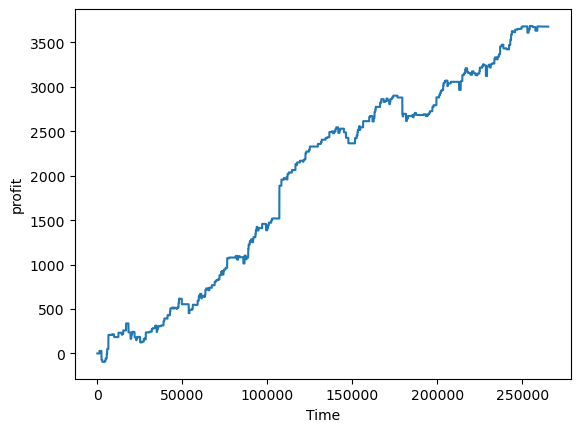

In [59]:
plt.plot(range(len(cumulation2)), cumulation2)
plt.xlabel("Time")
plt.ylabel("profit")

In [37]:
rfr_test.cal_return_annually()

7568.973184723408

In [38]:
rfr_test.cal_sharp_ratio()

0.018181903418614028

In [39]:
rfr_test.cal_win_rate()

0.7490196078431373

In [40]:
rfr_test.cal_profit_withdraw_ratio()

1.3177242522702117

# backtest for neural network

In [41]:
X_ss = ss_X.transform(alpha)
y_ml_pre = ss_y.inverse_transform((ml.predict(X_ss)).reshape(-1, 1))

D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


In [42]:
y_ml_pre

array([[-4.33716989e-04],
       [ 4.43278242e-06],
       [ 5.74264618e-04],
       [ 7.90340423e-04],
       [ 2.86449866e-04],
       [ 3.41566706e-04],
       [-2.46260051e-04],
       [-4.22271825e-05],
       [-1.00107883e-04],
       [-6.61236173e-05],
       [ 3.24508434e-05],
       [-9.82636709e-06],
       [-2.26606748e-04],
       [ 5.36801652e-04],
       [-2.18416608e-04],
       [ 5.23010440e-04],
       [ 2.57765130e-04],
       [ 1.00139166e-04],
       [ 3.98599779e-04],
       [ 1.21548395e-04],
       [-1.85906585e-04],
       [ 1.20439784e-04],
       [-6.19487390e-05],
       [ 4.37521575e-04],
       [ 4.68960690e-05],
       [ 6.14432614e-05],
       [-8.95923531e-05],
       [-2.70969839e-04],
       [ 1.07906741e-05],
       [ 1.28675899e-04],
       [ 2.09415536e-06],
       [ 4.14993327e-04],
       [ 1.55001634e-04],
       [-3.22645005e-05],
       [ 4.14645853e-04],
       [-3.47718415e-05],
       [-9.07096780e-05],
       [-1.72173700e-04],
       [ 1.1

In [43]:
y_ml_pre = pd.DataFrame(y_ml_pre, index = alpha.index)

In [44]:
X_before_ss = ss_X.transform(X_before)
y_ml_before = ss_y.inverse_transform((ml.predict(X_before_ss)).reshape(-1, 1))

D:\Python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


C:\Users\11920\AppData\Local\Temp\ipykernel_1768\2950822052.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_rfr_before)


<AxesSubplot: ylabel='Density'>

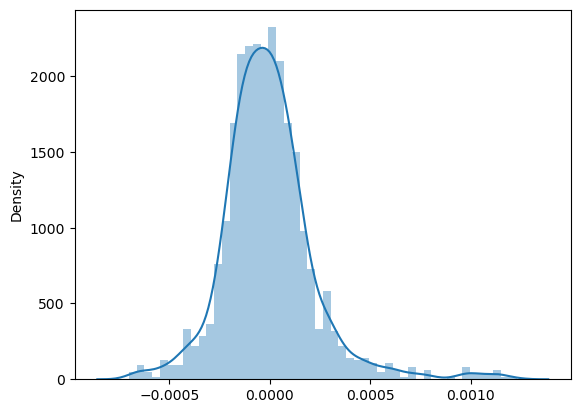

In [45]:
sns.distplot(y_rfr_before)

In [46]:
ml_test = backtest.Backtest(trade_data, y_ml_pre, y_ml_before.mean(), y_ml_before.std())

In [47]:
ml_test.run()

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -4.222718245601546e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
get pre_return:  0.0004375215750021686
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  1.079067412598537e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -6.493232250639108e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00017706619873188918
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00010569854000027894
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00017892124354137537
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -7.739177016428253e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0004576363709849444
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002892024325746901
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00014954445188663303
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002789375264744994
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -1.537308998444924e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00023275662765455906
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -1.84083863349222e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
get pre_return:  -5.078515942387375e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -4.481549014365278e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00040069046120273826
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00019893631518068391
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0003419865348159829
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0006609811508091549
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001553634469884946
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  7.124516529641664e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00010151172257942106
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00016979010297077444
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00026392149417407495
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -1.1641008841754329e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00026543125899120316
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -6.704152087989013e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00010631496095733314
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001946768007116854
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -1.3717019758402907e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -4.9360246756921084e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -9.91652421825028e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  5.105220835183132e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002593198304333088
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.0001951933540483447
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00016325997127507783
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -7.703663519048344e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  1.579119264003108e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
get pre_return:  -0.00023989523559276395
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  8.001094557969204e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002756216458589871
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
get pre_return:  6.898788959873835e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  7.420908010149948e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -8.58384765152371e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00016225331965042696
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

get pre_return:  -4.9920229218234566e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  4.381068399415808e-06
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0002641318597272027
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -8.666379258588181e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -3.6585304931633623e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00010349190331867286
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001833830474281932
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -8.51612311879834

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -1.573286850462502e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00010260640710116011
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
get pre_return:  -0.0005700825740550153
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.000218492419851254
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_ret

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  3.520482417201357e-06
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_re

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pr

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -8.193784082437302e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.0001249670238928477
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00016618137216708437
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  0.00044948076952717585
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00018704073113465252
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -7.374751569764741e-05
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_r

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre

no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
get pre_return:  -0.00022747575520742696
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_return
no pre_

In [48]:
cumulation3 = ml_test.cal_cumulative_return()

Text(0, 0.5, 'profit')

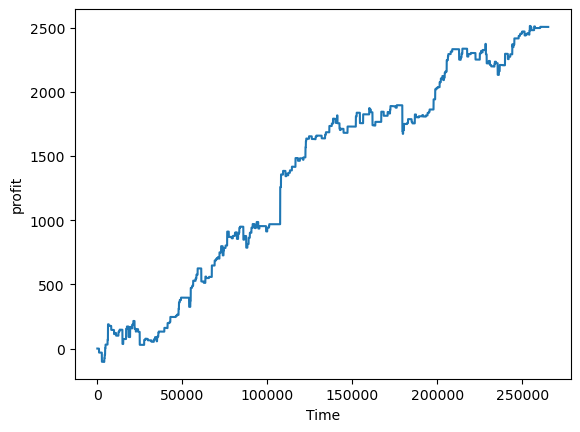

In [58]:
plt.plot(range(len(cumulation3)), cumulation3)
plt.xlabel("Time")
plt.ylabel("profit")

In [50]:
ml_test.cal_return_annually()

493.57981210025594

In [51]:
ml_test.cal_sharp_ratio()

0.013301304482774121

In [52]:
ml_test.cal_win_rate()

0.6958333333333333

In [53]:
ml_test.cal_profit_withdraw_ratio()

0.8703380592257415

In [54]:
performance  = pd.DataFrame([[reg_test.cal_return_annually(), rfr_test.cal_return_annually(), ml_test.cal_return_annually()],
                            [reg_test.cal_sharp_ratio(), rfr_test.cal_sharp_ratio(), ml_test.cal_sharp_ratio()],
                            [reg_test.cal_profit_withdraw_ratio(), rfr_test.cal_profit_withdraw_ratio(), ml_test.cal_profit_withdraw_ratio()],
                            [reg_test.cal_win_rate(), rfr_test.cal_win_rate(), ml_test.cal_win_rate()]], index=["annually return", "sharp ratio", "profit withdraw ratio", "win rate"])

In [55]:
performance = performance.T

In [56]:
performance.index = ["ridge regression", "random forest regression", "neural network"]

In [57]:
print(performance.to_latex())

\begin{tabular}{lrrrr}
\toprule
{} &  annually return &  sharp ratio &  profit withdraw ratio &  win rate \\
\midrule
ridge regression         &       942.003370 &     0.013273 &               0.667383 &  0.728571 \\
random forest regression &      7568.973185 &     0.018182 &               1.317724 &  0.749020 \\
neural network           &       493.579812 &     0.013301 &               0.870338 &  0.695833 \\
\bottomrule
\end{tabular}



C:\Users\11920\AppData\Local\Temp\ipykernel_1768\1553617856.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(performance.to_latex())
